In [103]:
import json
from lxml import etree
import re
import base64
from IPython import display

# Processed Data
Follow the [instruction](https://github.com/OSU-NLP-Group/Mind2Web#dataset-access) to download the processed training and test data. The directory structure should look like this:
```
Mind2Web
├── data
│   ├── train
│   │   └── train_*.json
│   ├── test_task
│   │   └── test_task_*.json
│   ├── test_website
│   │   └── test_website_*.json
│   └── test_domain
│       └── test_domain_*.json
└── ...
```

In [51]:
data_dir = "/local/scratch/deng.595/workspace/web_interface/release/Mind2Web"
with open(data_dir + "/data/train/train_0.json", "r") as f:
    samples = json.load(f)
    sample = samples[0]

In [52]:
print("Each data sample is a dict with the following keys:")
print(sample.keys())
for key in sample.keys():
    if key!="actions":
        if key!="action_reprs":
            print(f"{key}: {sample[key]}")
        else:
            print(f"{key}:")
            for i, action_repr in enumerate(sample[key]):
                print(f"\t{i}. {action_repr}")

Each data sample is a dict with the following keys:
dict_keys(['website', 'domain', 'subdomain', 'annotation_id', 'confirmed_task', 'action_reprs', 'actions'])
website: exploretock
domain: Travel
subdomain: Restaurant
annotation_id: 7bda9645-0b5f-470a-8dd7-6af0bff4da68
confirmed_task: Check for pickup restaurant available in Boston, NY on March 18, 5pm with just one guest
action_reprs:
	0. [combobox]  Reservation type -> SELECT: Pickup
	1. [svg]   -> CLICK
	2. [searchbox]  Find a location -> TYPE: Boston
	3. [span]  Boston -> CLICK
	4. [svg]   -> CLICK
	5. [button]  18 -> CLICK
	6. [combobox]  Time -> SELECT: 5:00 PM
	7. [svg]   -> CLICK
	8. [span]  2 guests -> CLICK
	9. [combobox]  Size -> SELECT: 1 guest
	10. [button]  Update search -> CLICK


In [73]:
action = sample["actions"][0]
print("Each task has a list of actions, each action is a dict with the following keys:")
print(action.keys())
print("action_uid:", action["action_uid"])
print("operation:", action["operation"])
print(("We provide both the \"raw_html\" of page before the action is performed, and \"cleaned_html\" with some elements removed using heuristics. "
       "Both documents can be parsed using lxml."))
raw_html = action["raw_html"]
print("raw_html:")
print(raw_html[:500]+"\n...")
raw_html_parsed = etree.fromstring(raw_html)
print("{} elements in raw_html".format(len(raw_html_parsed.xpath("//*"))))
cleaned_html = action["cleaned_html"]
print("cleaned_html:")
print(cleaned_html[:500]+"\n...")
cleaned_html_parsed = etree.fromstring(cleaned_html)
print("{} elements in cleaned_html".format(len(cleaned_html_parsed.xpath("//*"))))
print("\"action_uid\" is a unique identifier for each action. It can be used to extract the ground truth element from the raw_html with attribute \"data_pw_testid_buckeye\".")
print(raw_html_parsed.xpath(f"//*[@data_pw_testid_buckeye='{action['action_uid']}']"))
print("\"backend_node_id\" is a unique identifier for each element in the html document.")

Each task has a list of actions, each action is a dict with the following keys:
dict_keys(['action_uid', 'raw_html', 'cleaned_html', 'operation', 'pos_candidates', 'neg_candidates'])
action_uid: 961c3a5e-f8ce-4c71-a917-aa546dcea7fb
operation: {'original_op': 'SELECT', 'value': 'Pickup', 'op': 'SELECT'}
We provide both the "raw_html" of page before the action is performed, and "cleaned_html" with some elements removed using heuristics. Both documents can be parsed using lxml.
raw_html:
<!DOCTYPE html PUBLIC "-//W3C//DTD HTML 4.0 Transitional//EN" "http://www.w3.org/TR/REC-html40/loose.dtd">
<html backend_node_id="145" bounding_box_rect="0,0,1280,8308.671875" class="no-js">
  <body>
    <div backend_node_id="589" bounding_box_rect="0,0,1280,8308.671875" id="Root">
      <div backend_node_id="590" bounding_box_rect="0,0,1280,8308.671875" class="Wrapper">
        <div backend_node_id="597" bounding_box_rect="0,0,1280,8308.671875" class="LoadingComponent">
          <div backend_n
...
520 e

# Raw Data
Follow the [instruction]() to download the raw dump with the traces and extracted mhtmls/screenshots. The directory structure should look like this:
```
raw_dump
├── session
│   ├── {session_id}
│   │   ├── session.har.zip
│   │   └── videos
│   │       ├── {page_id}.webm
│   │       └── ...
|   └── ...
├── task
│   ├── {annotation_id}
│   │   ├── processed
│   │   │   ├── dom_content.json
│   │   │   ├── screenshot.json
│   │   │   └── snapshots
│   │   │       ├── {action_id}_before.mhtml
│   │   │       ├── {action_id}_after.mhtml
│   │   │       └── ...
│   │   ├── storage.json
│   │   └── trace.zip
│   └── ...
└── task_meta.json
```


In [91]:
data_dir = "/local/scratch/deng.595/workspace/web_interface/release/raw_dump"
with open(data_dir + "/task_meta.json", "r") as f:
    task_meta = json.load(f)
with open(data_dir + "/task/aa065caa-40fc-4479-bdaf-284b1b7033bc/processed/dom_content.json", "r") as f:
    dom_content = json.load(f)
with open(data_dir + "/task/aa065caa-40fc-4479-bdaf-284b1b7033bc/processed/screenshot.json", "r") as f:
    screenshots = json.load(f)

In [77]:
task_meta[0]

{'split': 'train',
 'website': 'exploretock',
 'annotation_id': '7bda9645-0b5f-470a-8dd7-6af0bff4da68',
 'session_id': '2e23470e-ef12-4a13-ad47-af511bfc8d7a',
 'confirmed_task': 'Check for pickup restaurant available in Boston, NY on March 18, 5pm with just one guest'}

All information under `processed` are extracted from the trace file `trace.zip` with help from the [playwright trace viewer](https://playwright.dev/python/docs/trace-viewer). See `src/data_utils/process_trace.py` for more detail.

`dom_content` is extracted via [Chrome DevTools](https://chromedevtools.github.io/devtools-protocol/tot/DOMSnapshot/#method-captureSnapshot), the `raw_html` and `cleaned_html` are converted from the captured dom content.

dict_keys(['action_uid', 'before', 'after', 'action'])


{'action_uid': '510e5531-6382-4ac9-ba13-d607109cbeb4',
 'before': {'dom': {'documents': [{'documentURL': 0,
     'title': 2,
     'baseURL': 1,
     'contentLanguage': -1,
     'encodingName': 3,
     'publicId': -1,
     'systemId': -1,
     'frameId': 4,
     'nodes': {'parentIndex': [-1,
       0,
       0,
       2,
       3,
       4,
       3,
       6,
       3,
       8,
       3,
       10,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       34,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       54,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       3,
       64,
       3,
       66,
       3,
       68,
       3,
  
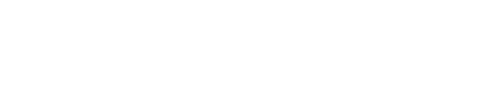
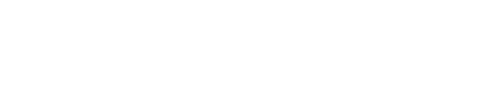

In [82]:
print(dom_content[0].keys())
dom_content[0]

<Element html at 0x7f2079746700>
<html backend_node_id="407" bounding_box_rect="0,0,1280,4592.953125" dir="ltr" lang="en-US"><head backend_node_id="408" bounding_box_rect="-1,-1,-1,-1"><style backend_node_id="409" bounding_box_rect="-1,-1,-1,-1"><text backend_node_id="410" bounding_box_rect="-1,-1,-1,-1">*,*::before,*::after { visibility: hidden }</text></style><style backend_node_id="411" bounding_box_rect="-1,-1,-1,-1"><text backend_node_id="412" bounding_box_rect="-1,-1,-1,-1">*[__playwright_target__="before@call@27"] { outline: 2px solid #006ab1 !important; background-color: #6fa8dc7f !important; }</text></style><style backend_node_id="413" bounding_box_rect="-1,-1,-1,-1"><text backend_node_id="414" bounding_box_rect="-1,-1,-1,-1">*[__playwright_target__="undefined"] { outline: 2px solid #006ab1 !important; background-color: #6fa8dc7f !important; }</text></style><script backend_node_id="415" bounding_box_rect="-1,-1,-1,-1"><text backend_node_id="416" bounding_box_rect="-1,-1,-1,-1"
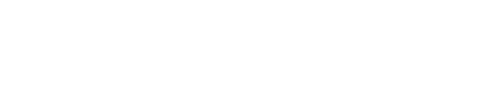
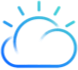
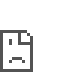
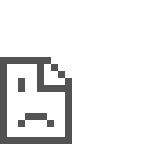
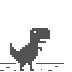
...
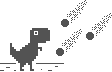
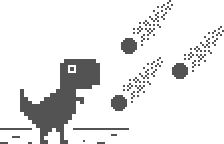
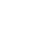
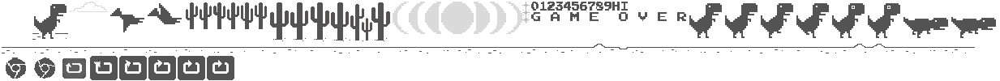
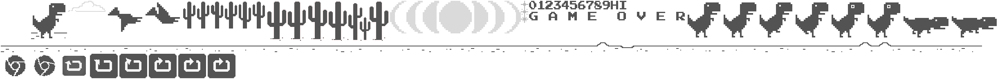

In [90]:
from src.data_utils.dom_utils import build_dom_tree
sample = dom_content[0]["before"]["dom"]
parsed_dom_tree = build_dom_tree(sample["documents"][0], sample["documents"], sample["strings"])
print(parsed_dom_tree)
print(etree.tostring(parsed_dom_tree, pretty_print=True).decode("utf-8"))

The screenshots are encoded as base64 strings. Ground truth action of each step is stored as `action.boudning_box`.

In [92]:
screenshots

[{'action_uid': '510e5531-6382-4ac9-ba13-d607109cbeb4',
  'before': {'screenshot': '/9j/4AAQSkZJRgABAQAAAQABAAD/4gHYSUNDX1BST0ZJTEUAAQEAAAHIAAAAAAQwAABtbnRyUkdCIFhZWiAAAAAAAAAAAAAAAABhY3NwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAA9tYAAQAAAADTLQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAlkZXNjAAAA8AAAACRyWFlaAAABFAAAABRnWFlaAAABKAAAABRiWFlaAAABPAAAABR3dHB0AAABUAAAABRyVFJDAAABZAAAAChnVFJDAAABZAAAAChiVFJDAAABZAAAAChjcHJ0AAABjAAAADxtbHVjAAAAAAAAAAEAAAAMZW5VUwAAAAgAAAAcAHMAUgBHAEJYWVogAAAAAAAAb6IAADj1AAADkFhZWiAAAAAAAABimQAAt4UAABjaWFlaIAAAAAAAACSgAAAPhAAAts9YWVogAAAAAAAA9tYAAQAAAADTLXBhcmEAAAAAAAQAAAACZmYAAPKnAAANWQAAE9AAAApbAAAAAAAAAABtbHVjAAAAAAAAAAEAAAAMZW5VUwAAACAAAAAcAEcAbwBvAGcAbABlACAASQBuAGMALgAgADIAMAAxADb/2wBDAAMCAgMCAgMDAwMEAwMEBQgFBQQEBQoHBwYIDAoMDAsKCwsNDhIQDQ4RDgsLEBYQERMUFRUVDA8XGBYUGBIUFRT/2wBDAQMEBAUEBQkFBQkUDQsNFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBQUFBT/wAARCBHxBQADASIAAhEBAxEB/8QAHgABAAAHAQEBAAAAAAAAAAAAAAIDBQYHCAkEAQr/xACA

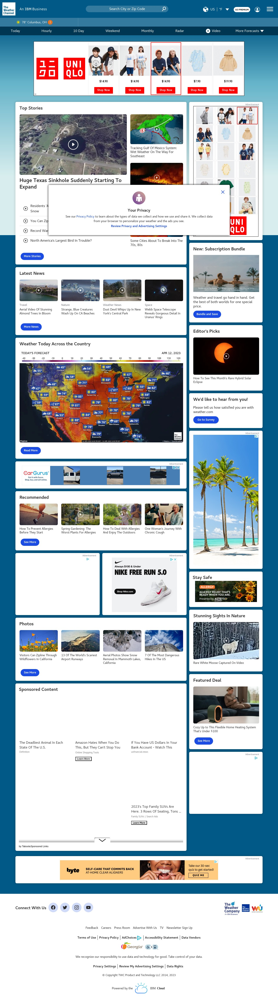

In [104]:
display.Image(base64.b64decode(screenshots[0]["before"]["screenshot"]))